In [1]:
import numpy as np
import pandas as pd

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score, accuracy_score, roc_curve, roc_auc_score,
from sklearn.linear_model import LogisticRegression

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV, train_test_split, RandomizedSearchCV, cross_val_score
from scipy.stats import randint

In [2]:
ML_df_features_train = pd.read_csv("features_train.csv") 
ML_df_features_train.head()

,Id,0,1,2,3,4,5,6,7,8,...,110,111,112,113,114,115,116,117,118,119
0,0,2.311705,0.445665,7.020637,1.582505,3.010977,1.375501,29.897623,2.886738,-8.641869,...,0.642797,0.706869,0.997519,1.270321,0.109460,2.829606,-8.292344,1.423754,0.090224,2.006436
1,1,0.580430,0.200428,22.176950,0.479475,0.173418,0.106690,-28.162402,5.388960,-9.188298,...,1.966491,0.330869,0.449754,0.257662,-1.131653,-0.908362,20.468617,1.146844,0.142068,0.373541
2,2,0.042687,0.641976,1.663984,0.998398,1.262488,0.784453,-22.016388,1.512673,-3.526049,...,0.897811,0.610529,0.158270,5.695307,0.358590,-8.164399,0.596139,0.522287,0.832107,4.264087
3,3,0.060388,1.408700,92.827212,2.691115,0.645211,0.710104,12.132919,1.606096,-0.782570,...,1.375550,0.708163,0.537862,1.357389,-1.659754,-1.105801,-6.426477,0.404628,0.452828,1.106436
4,4,1.045148,0.704313,4.823582,0.546102,0.397827,0.606078,-11.135888,0.639788,-9.182691,...,10.556016,0.225400,0.672425,0.257381,-0.435355,7.744958,10.908781,4.413541,0.782079,0.279165


feature engineering is not possible with no information about the features

In [3]:
ML_df_target_train = pd.read_csv("target_train.csv") 
ML_df_target_train.head()

,Id,Expected
0,0,0
1,1,0
2,2,2
3,3,1
4,4,2


### Classes look approximately evenly distributed
3 classes to predict

In [8]:
ML_df_target_train["Expected"].value_counts()

Expected
2    3365
0    3341
1    3294
Name: count, dtype: int64

### Correlation heatmap
no highly correlated features

In [10]:
correlation_matrix = ML_df_features_train.corr(numeric_only=True)

plt.figure(figsize=(160, 120))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

### Boxplots comparing feature values for each class

In [13]:
## first combine feature and target datasets ML_df_features_train ML_df_target_train
print(ML_df_features_train.shape, ML_df_target_train.shape)
print(ML_df_features_train.columns, ML_df_target_train.columns)

(10000, 121) (10000, 2)
Index(['Id', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '110', '111', '112', '113', '114', '115', '116', '117', '118', '119'],
      dtype='object', length=121) Index(['Id', 'Expected'], dtype='object')


In [4]:
##merged dataframe
ML_df_train_merge = pd.merge(ML_df_features_train, ML_df_target_train,
                        how="outer",
                        on="Id")
print(ML_df_train_merge.shape)
print(ML_df_train_merge.isna().sum())
ML_df_train_merge.head()
#ML_df_train_merge.to_csv('ML_df_train_merge.csv', index=False)

(10000, 122)
Id          0
0           0
1           0
2           0
3           0
           ..
116         0
117         0
118         0
119         0
Expected    0
Length: 122, dtype: int64


,Id,0,1,2,3,4,5,6,7,8,...,111,112,113,114,115,116,117,118,119,Expected
0,0,2.311705,0.445665,7.020637,1.582505,3.010977,1.375501,29.897623,2.886738,-8.641869,...,0.706869,0.997519,1.270321,0.109460,2.829606,-8.292344,1.423754,0.090224,2.006436,0
1,1,0.580430,0.200428,22.176950,0.479475,0.173418,0.106690,-28.162402,5.388960,-9.188298,...,0.330869,0.449754,0.257662,-1.131653,-0.908362,20.468617,1.146844,0.142068,0.373541,0
2,2,0.042687,0.641976,1.663984,0.998398,1.262488,0.784453,-22.016388,1.512673,-3.526049,...,0.610529,0.158270,5.695307,0.358590,-8.164399,0.596139,0.522287,0.832107,4.264087,2
3,3,0.060388,1.408700,92.827212,2.691115,0.645211,0.710104,12.132919,1.606096,-0.782570,...,0.708163,0.537862,1.357389,-1.659754,-1.105801,-6.426477,0.404628,0.452828,1.106436,1
4,4,1.045148,0.704313,4.823582,0.546102,0.397827,0.606078,-11.135888,0.639788,-9.182691,...,0.225400,0.672425,0.257381,-0.435355,7.744958,10.908781,4.413541,0.782079,0.279165,2


### Boxplots show lots of outliers
I will remove them and see if any other relationships become visible
* interesting_features = [11, 20, 50, 60, 61, 72, 74, 86, 87, 90, 98]

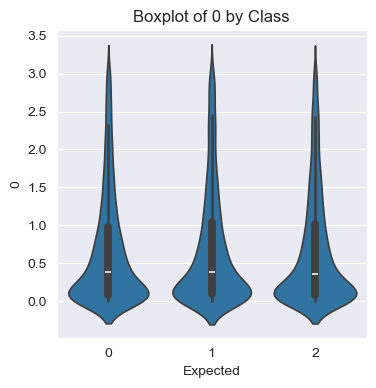

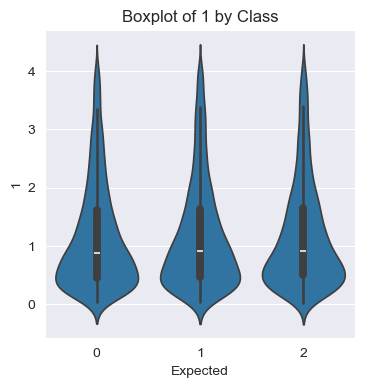

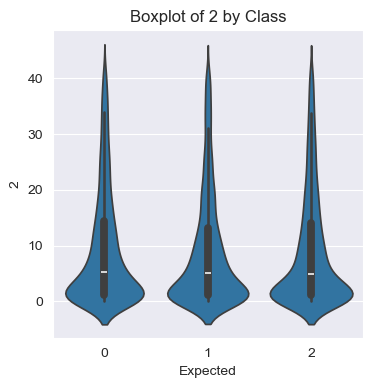

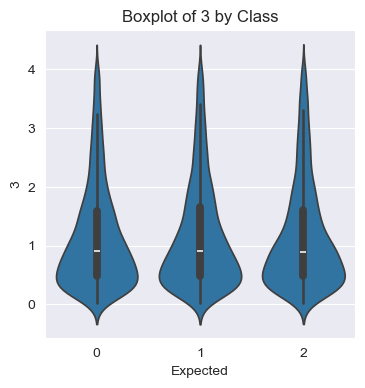

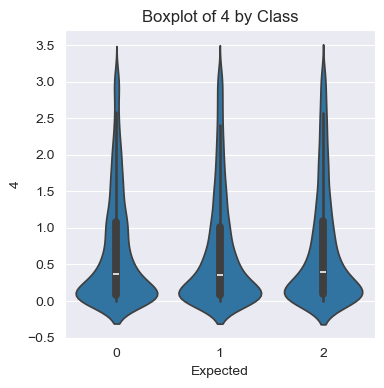

...

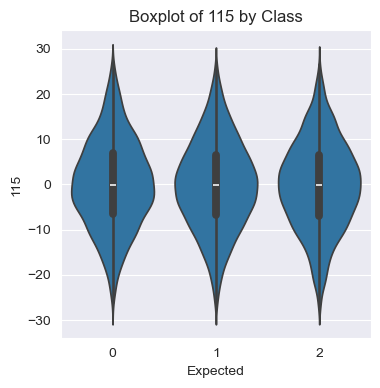

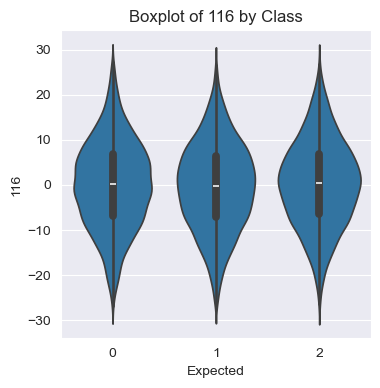

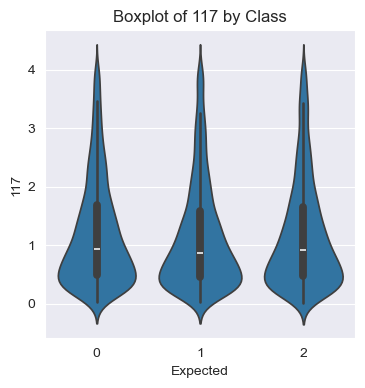

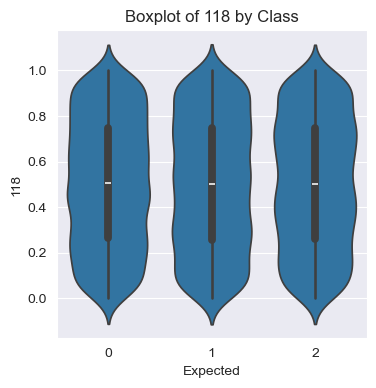

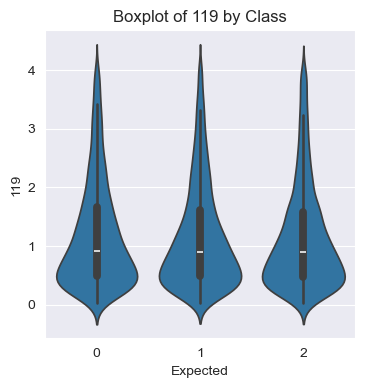

In [25]:
# Iterate through each column (variable)
for col in ML_df_train_merge.columns:
    # Skip the 'Class' column (Expected) and Id column
    if col == 'Expected' or col == 'Id':
        continue

    plt.figure(figsize=(4, 4))
    sns.boxplot(x='Expected', y=col, data=ML_df_train_merge)
    plt.title(f'Boxplot of {col} by Class')
    plt.show()

### Function to remove outliers in each column and replace with NaN

In [42]:
from scipy import stats

def replace_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = np.where((df[column] < lower_bound) | (df[column] > upper_bound), np.nan, df[column])
    return df

In [43]:
## loop through all relevant columns in merged df and apply replace_outliers_iqr function
for col in ML_df_train_merge.columns:
    # Skip the 'Class' column (Expected) and Id column
    if col == 'Expected' or col == 'Id':
        continue
    merged_outliers = replace_outliers_iqr(ML_df_train_merge, col)
merged_outliers.head()

,Id,0,1,2,3,4,5,6,7,8,...,111,112,113,114,115,116,117,118,119,Expected
0,0,2.311705,0.445665,7.020637,1.582505,3.010977,1.375501,29.897623,2.886738,-8.641869,...,0.706869,0.997519,1.270321,0.109460,2.829606,-8.292344,1.423754,0.090224,2.006436,0
1,1,0.580430,0.200428,22.176950,0.479475,0.173418,0.106690,-28.162402,NaN,-9.188298,...,0.330869,0.449754,0.257662,-1.131653,-0.908362,20.468617,1.146844,0.142068,0.373541,0
2,2,0.042687,0.641976,1.663984,0.998398,1.262488,0.784453,-22.016388,1.512673,-3.526049,...,0.610529,0.158270,NaN,0.358590,-8.164399,0.596139,0.522287,0.832107,NaN,2
3,3,0.060388,1.408700,NaN,2.691115,0.645211,0.710104,12.132919,1.606096,-0.782570,...,0.708163,0.537862,1.357389,-1.659754,-1.105801,-6.426477,0.404628,0.452828,1.106436,1
4,4,1.045148,0.704313,4.823582,0.546102,0.397827,0.606078,-11.135888,0.639788,-9.182691,...,0.225400,0.672425,0.257381,-0.435355,7.744958,10.908781,NaN,0.782079,0.279165,2


### Boxplots with some outlier removal
added a few new interesting features to my list
* intresting_features= [11, 20, 24, 27, 34, 50, 60, 61, 62, 72, 74, 86, 87, 90, 95, 98, 112, 116, 117]

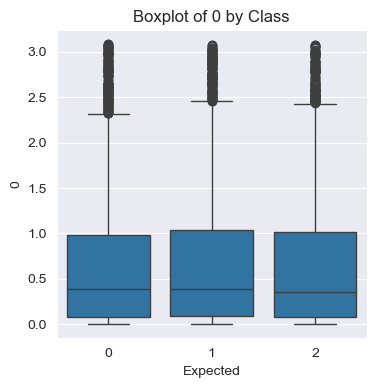

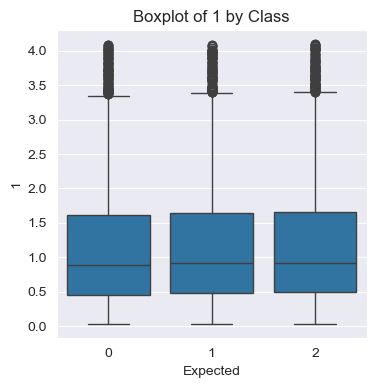

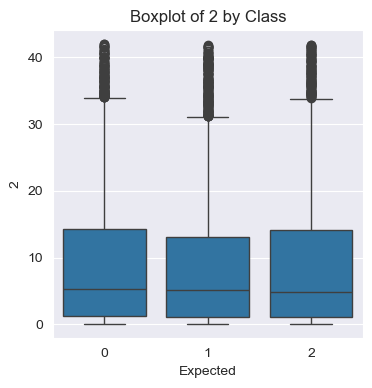

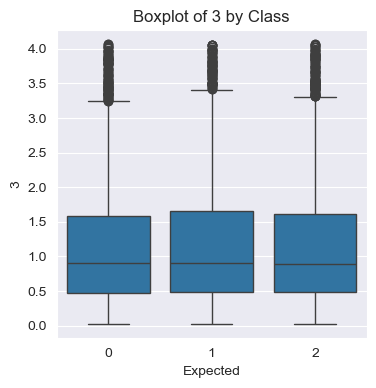

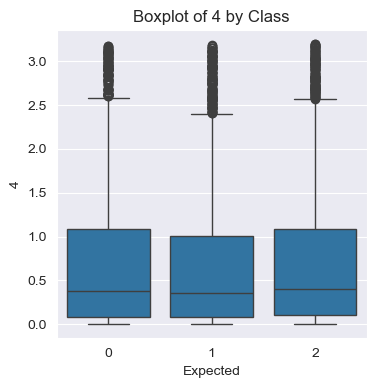

...

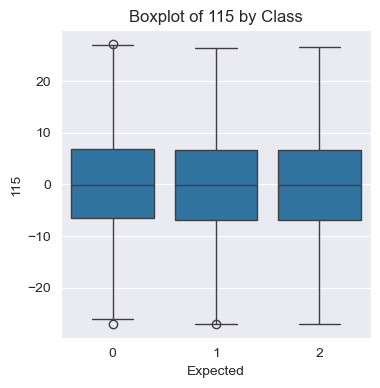

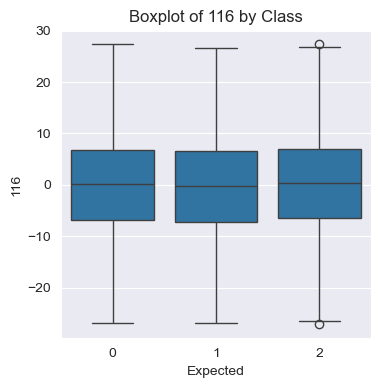

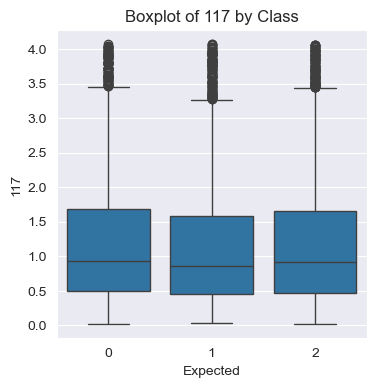

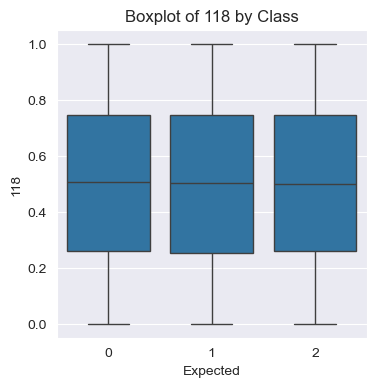

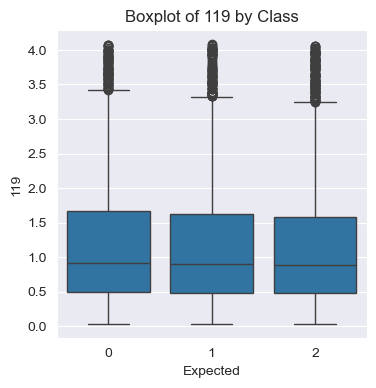

In [23]:
# Iterate through each column (variable)
for col in merged_outliers.columns:
    # Skip the 'Class' column (Expected) and Id column
    if col == 'Expected' or col == 'Id':
        continue

    plt.figure(figsize=(4, 4))
    sns.boxplot(x='Expected', y=col, data=merged_outliers)
    plt.title(f'Boxplot of {col} by Class')
    plt.show()

In [5]:
## creating df with selected interesting columns from data exploration stage
intresting_features= ["11", "20", "24", "27", "34", "50", "60", "61", "62", "72",
                      "74", "86", "87", "90", "95", "98", "112", "116", "117"]
df_small = ML_df_train_merge[intresting_features]
df_small.head()

,11,20,24,27,34,50,60,61,62,72,74,86,87,90,95,98,112,116,117
0,2.280097,-1.015441,-4.479576,0.481742,23.808472,0.063419,52.903985,0.467676,16.306059,-0.472142,5.125120,-0.315395,1.871807,0.641523,0.046830,2.038736,0.997519,-8.292344,1.423754
1,-5.775092,-2.875074,0.764284,0.037002,5.738793,39.349176,0.103176,0.008065,4.646883,2.106962,0.664921,-1.230639,7.049593,0.895187,0.533213,0.413158,0.449754,20.468617,1.146844
2,-5.828967,4.494041,0.950084,0.410431,19.629010,0.112884,1.238414,0.339700,94.645030,-7.420275,91.770769,6.344787,0.136055,1.975385,0.105972,3.701254,0.158270,0.596139,0.522287
3,-4.796236,2.786869,-1.805663,0.013685,25.526839,1484.131591,42.968391,1.581812,14.622529,2.506215,7.526305,-2.016885,10.358130,-1.715203,0.681664,5.892810,0.537862,-6.426477,0.404628
4,-6.056380,-4.401633,0.228554,0.845195,5.240953,0.212263,0.022609,0.399809,8.093200,-4.651395,1.461310,3.523166,60.634258,-0.608828,1.732382,2.157437,0.672425,10.908781,4.413541


## Run rf to see if the important features are the same as the ones I chose

In [58]:
## selected columns train test split
X= ML_df_train_merge.drop(["Id", "Expected"], axis="columns")
y= ML_df_train_merge["Expected"]

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape

((8000, 120), (2000, 120), (8000,))

In [60]:
#random forest
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[322 172 196]
 [136 351 146]
 [181 179 317]]
              precision    recall  f1-score   support

           0       0.50      0.47      0.48       690
           1       0.50      0.55      0.53       633
           2       0.48      0.47      0.47       677

    accuracy                           0.49      2000
   macro avg       0.49      0.50      0.49      2000
weighted avg       0.49      0.49      0.49      2000



In [74]:
# Get feature importances
feature_importances = rf.feature_importances_

# Visualize feature importances (optional)
# Get feature names (if available)
feature_names = [f'feature_{i}' for i in range(X_train.shape[1])] #Example feature names

# Create a DataFrame to store feature importances and names
feature_importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
})

# Sort the DataFrame by importance (descending order)
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)
top_20 = feature_importance_df.head(20)

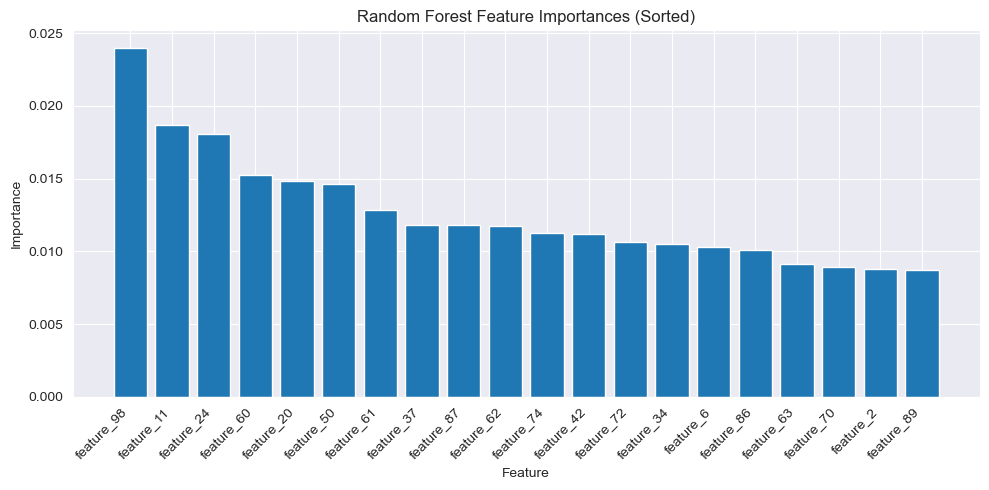

In [76]:
# Visualize the sorted feature importances (optional)
plt.figure(figsize=(10, 5))
plt.bar(top_20['feature'], top_20['importance'])
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances (Sorted)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Adding rf features to my list

In [22]:
intresting_features= ["2", "6", "11", "20", "24", "27", "34", "37", "42", "50", "60", "61", "62", "63", "70", "72",
                      "74", "86", "87", "89", "90", "95", "98", "112", "116", "117"]
df_small2 = ML_df_train_merge[intresting_features]
df_small2.head()
#df_small2.to_csv('df_small_extended.csv')

## Use PyCarat compare_models to find best performing model on this reduced df
best models: catboost, lightgbm, xgboost, rf

In [7]:
## selected columns
X_small = df_small2
y_small = ML_df_train_merge['Expected']
X_small.shape, y_small.shape

((10000, 26), (10000,))

In [8]:
## selected columns train test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_small, y_small, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape

((8000, 26), (2000, 26), (8000,))

### Baseline RandomForest

In [10]:
#random forest with selected features only
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[407 120 163]
 [111 411 111]
 [143 132 402]]
              precision    recall  f1-score   support

           0       0.62      0.59      0.60       690
           1       0.62      0.65      0.63       633
           2       0.59      0.59      0.59       677

    accuracy                           0.61      2000
   macro avg       0.61      0.61      0.61      2000
weighted avg       0.61      0.61      0.61      2000



### RandomForest tuning

In [12]:
# rf tuning
param_distributions = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 5, 10, 15, 20, 25, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8, 10, 20],
    'max_features': ['sqrt', 'log2', None, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
}

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_distributions,
    n_iter=30,  # Adjust the number of iterations as needed
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=0
)

random_search.fit(X_train, y_train)

print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

Best parameters: {'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 0.3, 'max_depth': 20}
Best score: 0.6278750000000001


In [13]:
#focused tuning
param_distributions = {
    'n_estimators': [375, 400, 425, 450],
    'max_depth': [19, 20, 21, 22],
    'min_samples_split': [10, 15, 20],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2', None, 0.3]
}

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_distributions,
    n_iter=30,  # Adjust the number of iterations as needed
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=0
)

random_search.fit(X_train, y_train)

print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

Best parameters: {'n_estimators': 375, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 0.3, 'max_depth': 22}
Best score: 0.63375


### Test best randomforest parameters on test data

In [15]:
rf_best= RandomForestClassifier(n_estimators=375, random_state=42, min_samples_split=10,
                           min_samples_leaf=1, max_features= 0.3, max_depth= 22)

## train model
rf_best.fit(X_train, y_train)
rf_best= rf_best.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.62      0.59      0.60       690
           1       0.62      0.65      0.63       633
           2       0.59      0.59      0.59       677

    accuracy                           0.61      2000
   macro avg       0.61      0.61      0.61      2000
weighted avg       0.61      0.61      0.61      2000



## Baseline Catboost

In [25]:
X_train.columns

Index(['2', '6', '11', '20', '24', '27', '34', '37', '42', '50', '60', '61',
       '62', '63', '70', '72', '74', '86', '87', '89', '90', '95', '98', '112',
       '116', '117'],
      dtype='object')

In [16]:
## catboost generally does not require data to be scaled
from catboost import CatBoostClassifier, Pool

c_boost= CatBoostClassifier(iterations=100, random_state=42, verbose=0)

## train model
c_boost.fit(X_train, y_train)
y_pred= c_boost.predict(X_test)
print(classification_report(y_test, y_pred))
# Get feature importances
feature_importances = c_boost.get_feature_importance()

# Print feature importances
print(feature_importances)

              precision    recall  f1-score   support

           0       0.65      0.61      0.63       690
           1       0.63      0.65      0.64       633
           2       0.61      0.62      0.62       677

    accuracy                           0.63      2000
   macro avg       0.63      0.63      0.63      2000
weighted avg       0.63      0.63      0.63      2000

[2.14327929 6.64324549 6.52083262 6.20071573 7.1232785  1.5125506
 2.31575598 7.22993274 5.53586906 5.56545682 5.61474048 4.97977966
 2.59040279 1.76899962 1.74748607 5.04893572 4.04327792 4.23814241
 3.28061078 1.41280285 1.28408092 1.52938309 8.24043279 0.90694322
 1.48583114 1.03723371]


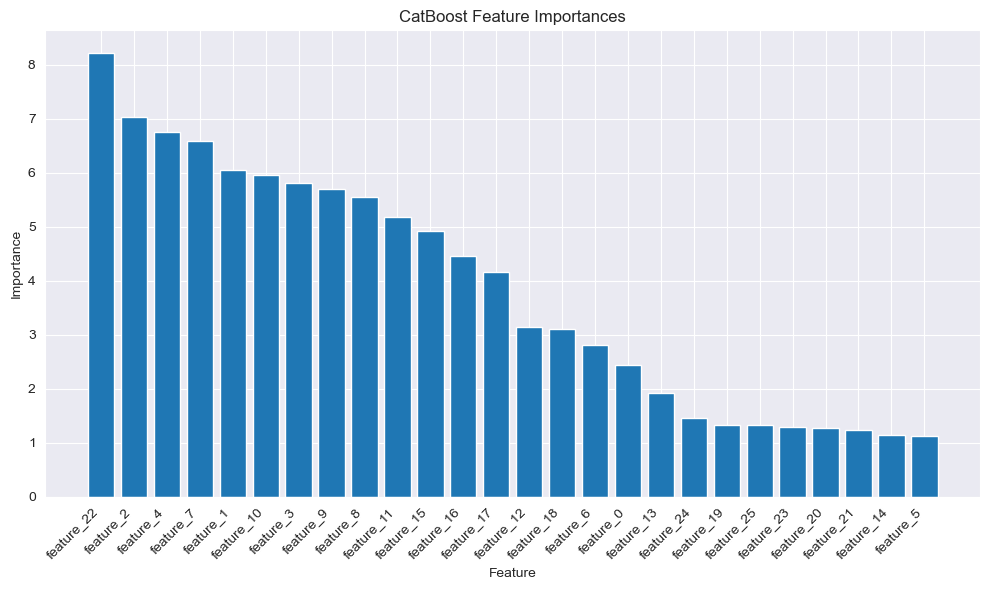

In [23]:
## catboost feature importances
import matplotlib.pyplot as plt
feature_importances = c_boost.get_feature_importance()
# Get feature names (if available)
feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]  # Example feature names

# Visualize feature importances
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['feature'], feature_importance_df['importance'])
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('CatBoost Feature Importances')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The index got reset so the feature names are not the same as in my original list

### Catboost hyperparameter tuning

In [14]:
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

param_distributions = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8],
    'l2_leaf_reg': [1, 3, 5]
}

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Randomized search
random_search = RandomizedSearchCV(
    estimator=c_boost,
    param_distributions=param_distributions,
    n_iter=100,  # Number of parameter settings sampled
    scoring='f1_macro',
    cv=cv,
    random_state=42,
    n_jobs=-1,
    verbose=0
)


# Fit the randomized search
random_search.fit(X_train, y_train)

# Best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

/opt/anaconda3/envs/MLG/lib/python3.10/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 81 is smaller than n_iter=100. Running 81 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters: {'learning_rate': 0.05, 'l2_leaf_reg': 1, 'iterations': 300, 'depth': 8}
Best score: 0.602966948720879


## refined hyperparameter tuning
based on the best parameters from the general tuning above

In [19]:
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

param_distributions = {
    'iterations': [250, 275, 300, 325, 350],
    'learning_rate': [0.04, 0.045, 0.05, 0.055, 0.06],
    'depth': [7, 8, 9],
    'l2_leaf_reg': [0.5, 0.75, 1, 1.25, 1.5]
}

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Randomized search
random_search = RandomizedSearchCV(
    estimator=c_boost,
    param_distributions=param_distributions,
    n_iter=30,  # Number of parameter settings sampled
    scoring='f1_macro',
    cv=cv,
    random_state=42,
    n_jobs=-1,
    verbose=0
)

# Fit the randomized search
random_search.fit(X_train, y_train)

# Best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

Best parameters: {'learning_rate': 0.055, 'l2_leaf_reg': 1.5, 'iterations': 300, 'depth': 9}
Best score: 0.6672921959736988


In [26]:
param_distributions = {
    'iterations': [350, 450, 500, 600],
    'learning_rate': [0.055],
    'depth': [9, 10, 12],
    'l2_leaf_reg': [1.5, 2]
}

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Randomized search
random_search = RandomizedSearchCV(
    estimator=c_boost,
    param_distributions=param_distributions,
    n_iter=30,  # Number of parameter settings sampled
    scoring='f1_macro',
    cv=cv,
    random_state=42,
    n_jobs=-1,
    verbose=0
)

# Fit the randomized search
random_search.fit(X_train, y_train)

# Best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

/opt/anaconda3/envs/MLG/lib/python3.10/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 24 is smaller than n_iter=30. Running 24 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters: {'learning_rate': 0.055, 'l2_leaf_reg': 2, 'iterations': 600, 'depth': 10}
Best score: 0.6731989866513503


## Check performance of best catboost model on test data

In [27]:
c_boost= CatBoostClassifier(iterations=600, random_state=42, verbose=0,
                           depth=10, learning_rate= 0.055, l2_leaf_reg= 2)

## train model
c_boost.fit(X_train, y_train)
y_pred= c_boost.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.64      0.62      0.63       690
           1       0.66      0.69      0.67       633
           2       0.64      0.63      0.63       677

    accuracy                           0.65      2000
   macro avg       0.65      0.65      0.65      2000
weighted avg       0.65      0.65      0.65      2000



In [28]:
ML_df_features_test = pd.read_csv("features_test.csv")

test_IDs = ML_df_features_test["Id"]

intresting_features= ["2", "6", "11", "20", "24", "27", "34", "37", "42", "50", "60", "61", "62", "63", "70", "72",
                      "74", "86", "87", "89", "90", "95", "98", "112", "116", "117"]
X_test_final = ML_df_features_test[intresting_features]

X_test_final.head()

,2,6,11,20,24,27,34,37,42,50,...,74,86,87,89,90,95,98,112,116,117
0,9.531945,-23.881055,-5.475461,1.396366,-0.885763,0.997524,12.226808,5.515789,-1.329417,0.278009,...,0.118797,1.157463,5.907949,0.145993,1.159353,0.020313,1.627644,0.927718,12.651970,3.191951
1,13.064256,-47.774112,1.160366,-10.584147,1.870688,0.648007,0.511789,-1.109945,3.385397,2.754611,...,1484.131591,0.783257,18.881935,5.099039,-0.272946,0.436224,-5.143795,0.114691,-0.839493,3.405661
2,10.370677,65.747722,-1.802028,-7.137388,-3.256410,0.260047,4.803465,-4.953978,-0.222840,33.041780,...,13.434883,1.117406,0.976244,0.000021,-0.075751,0.172488,-1.672424,0.818678,-11.567759,0.387331
3,0.379516,-11.036037,-6.004230,1.907041,-1.801898,0.065125,3.874274,1.836020,-1.925966,1484.131591,...,4.351740,-1.239871,0.083456,0.002386,0.331301,0.282886,-0.704601,0.124984,-3.481156,0.374161
4,0.535448,8.185199,2.263138,-4.322174,0.366459,0.198913,4.956541,-1.147118,-2.211748,108.464776,...,9.081033,4.020908,0.690354,2.363097,-0.836150,0.004548,-0.988028,0.156150,3.467491,0.339719


### Running model on test data and saving file for kaggle submission

In [29]:
predictions= c_boost.predict(X_test_final)
print(predictions)
predictions=[x[0] for x in predictions]
#submission = pd.concat([test_IDs, predictions], axis=1)
submission = pd.DataFrame({"Id": test_IDs.values, "Predicted": predictions})
submission.to_csv("submission_2.csv", index=False)



[[2]
 [0]
 [1]
 ...
 [2]
 [0]
 [2]]


Kaggle submission score 0.67